In [1]:
%matplotlib inline

In [2]:
from traffic.data.samples import belevingsvlucht

In [3]:
print(belevingsvlucht)

Flight(icao24='484506', callsign='TRA051')


In [4]:
from rich.pretty import pprint
pprint(belevingsvlucht)

Flight(icao24='484506', callsign='TRA051')

In [5]:
# the console is not necessary if you ran pretty.install()
from rich.console import Console
console = Console()
console.print(belevingsvlucht)

Flight 
  - callsign: TRA051   
  - aircraft: 484506 · 🇳🇱 PH-HZO (B738)
  - start: 2018-05-30 15:21:38Z 
  - stop: 2018-05-30 20:22:56Z
  - duration: 0 days 05:01:18
  - sampling rate: 1 second(s)
  - features:
    o altitude, int64
    o groundspeed, int64
    o latitude, double
    o longitude, double
    o timestamp, timestamp
    o track, int64
    o vertical_rate, int64

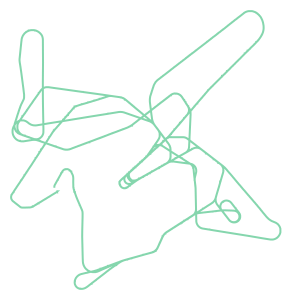

In [6]:
belevingsvlucht

In [7]:
dict(belevingsvlucht)

{'callsign': 'TRA051',
 'icao24': '484506',
 'aircraft': Tail(icao24='484506', registration='PH-HZO', typecode='B738', flag='🇳🇱'),
 'start': Timestamp('2018-05-30 15:21:38+0000', tz='UTC'),
 'stop': Timestamp('2018-05-30 20:22:56+0000', tz='UTC'),
 'duration': Timedelta('0 days 05:01:18')}

In [8]:
(belevingsvlucht.start, belevingsvlucht.stop)

(Timestamp('2018-05-30 15:21:38+0000', tz='UTC'),
 Timestamp('2018-05-30 20:22:56+0000', tz='UTC'))

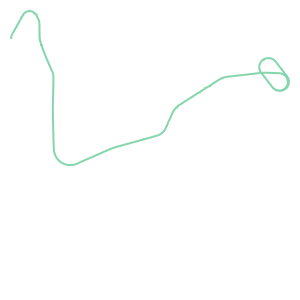

In [9]:
belevingsvlucht.first(minutes=30)

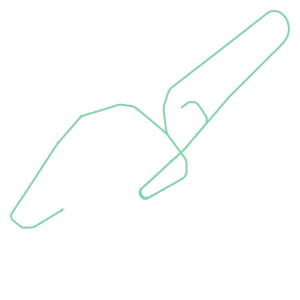

In [10]:
belevingsvlucht.after("2018-05-30 19:00", strict=False)

In [11]:
belevingsvlucht.between("2018-05-30 19:00", "2018-05-30 20:00").data

,timestamp,icao24,latitude,longitude,groundspeed,track,vertical_rate,callsign,altitude
11750,2018-05-30 19:00:01+00:00,484506,52.839973,5.793947,290,52,-1664,TRA051,8233
11751,2018-05-30 19:00:02+00:00,484506,52.840747,5.79568,290,52,-1664,TRA051,8200
11752,2018-05-30 19:00:03+00:00,484506,52.841812,5.797501,290,52,-1664,TRA051,8200
11753,2018-05-30 19:00:04+00:00,484506,52.842609,5.799133,290,52,-1599,TRA051,8149
11754,2018-05-30 19:00:05+00:00,484506,52.843277,5.80101,289,52,-1599,TRA051,8125
...,...,...,...,...,...,...,...,...,...
14750,2018-05-30 19:59:54+00:00,484506,52.84964,5.357513,277,280,0,TRA051,6000
14751,2018-05-30 19:59:56+00:00,484506,52.850104,5.351205,277,277,640,TRA051,6025
14752,2018-05-30 19:59:57+00:00,484506,52.850281,5.349197,277,277,640,TRA051,6050
14753,2018-05-30 19:59:58+00:00,484506,52.85043,5.347046,277,277,1088,TRA051,6050


In [12]:
from traffic.data.samples import quickstart

In [13]:
quickstart

,,count
icao24,callsign,
39d300,TVF91KQ,3893
39b002,FHMAC,3360
3aabfc,FMY8055,2669
39c82b,PEA501,2247
4241bb,VPCAL,2168
02a195,TAR722,2166
398495,CCM774V,2134
4bc844,PGT90Y,2124
39ceb4,TVF19YP,2076


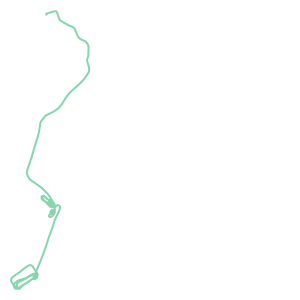

In [14]:
quickstart["TAR722"]  # return type: Flight, based on callsign
quickstart["39b002"]  # return type: Flight, based on icao24

In [15]:
quickstart[0]  # return type: Flight, the first trajectory in the collection
quickstart[:10]  # return type: Traffic, the 10 first trajectories in the collection

,,count
icao24,callsign,
02a195,TAR722,2166
0a0046,DAH1011,1323
0101de,MSR799,1290
34150e,IBE34AK,1152
06a2b1,QTR9UU,1144
0a0047,DAH1000,1111
300789,IWALK,1024
06a1e7,QTR23JR,874
06a133,QQE940,803


In [16]:
quickstart[['AFR83HQ', 'AFR83PX', 'AFR84UW', 'AFR91QD']]

,,count
icao24,callsign,
394c04,AFR83PX,1274
3946e2,AFR84UW,1112
3946e0,AFR91QD,1078
3950d0,AFR83HQ,650


In [17]:
quickstart.query('callsign.str.startswith("AFR")')

,,count
icao24,callsign,
393324,AFR69CR,1992
393320,AFR85FF,1975
398564,AFR9455,1666
3985a4,AFR19BH,1636
3944f1,AFR15AH,1546
3944f0,AFR51LU,1525
393321,AFR18KJ,1486
3944ed,AFR71ZP,1463
3950cd,AFR26TR,1396


In [18]:
quickstart.assign_id().eval()

,count
flight_id,
TVF91KQ_137,3893
FHMAC_116,3360
VPCAL_156,2168
TAR722_001,2166
CCM774V_087,2134
PGT90Y_196,2124
TVF19YP_134,2076
JFA12P_207,2057
AFR69CR_025,1992


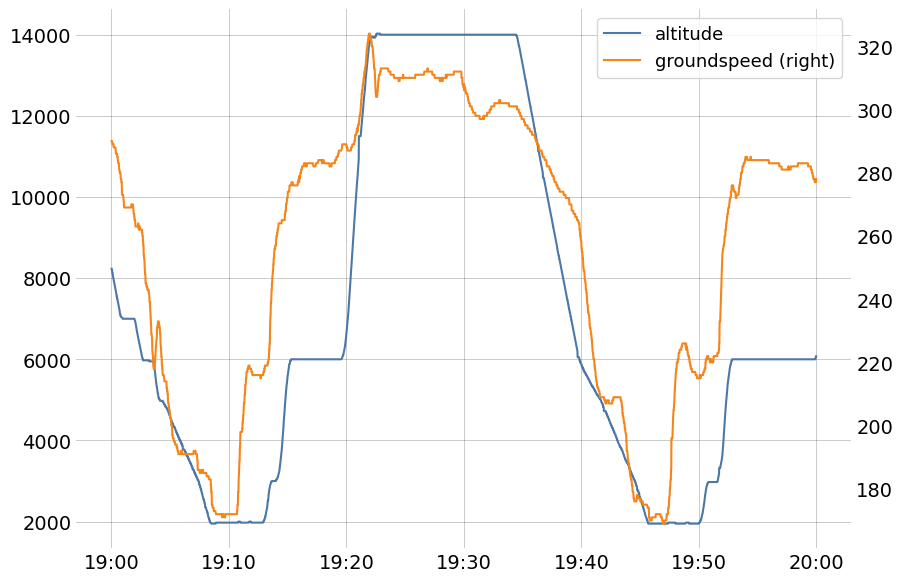

In [19]:
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

with plt.style.context("traffic"):

    fig, ax = plt.subplots(figsize=(10, 7))

    (
        belevingsvlucht
        .between("2018-05-30 19:00", "2018-05-30 20:00")
        .plot_time(
            ax=ax,
            y=["altitude", "groundspeed"],
            secondary_y=["groundspeed"]
        )
    )

    ax.set_xlabel("")
    ax.tick_params(axis='x', labelrotation=0)
    ax.xaxis.set_major_formatter(DateFormatter("%H:%M"))

In [20]:
subset = quickstart[["TVF22LK", "EJU53MF", "TVF51HP", "TVF78YY", "VLG8030"]]

In [21]:
subset = subset.query("altitude.isnull() or altitude < 20000")

In [22]:
subset[0].chart()

alt.Chart(...)

In [23]:
import altair as alt

# necessary line if you see an error about a maximum number of rows
alt.data_transformers.disable_max_rows()

alt.layer(
    *(
        flight.chart().encode(
            alt.Y("callsign", sort="x", title=None),
            alt.Color("callsign", legend=None),
        )
        for flight in subset
    )
).configure_line(strokeWidth=4)

alt.LayerChart(...)

In [24]:
alt.layer(
    *(
        flight.chart().encode(
            alt.Y("altitude"),
            alt.Color("callsign"),
        )
        for flight in subset
    )
)

alt.LayerChart(...)

In [25]:
chart = (
    alt.layer(
        *(
            flight.chart().encode(
                alt.X(
                    "utcdayhoursminutesseconds(timestamp)",
                    axis=alt.Axis(format="%H:%M"),
                    title=None,
                ),
                alt.Y("altitude", title=None, scale=alt.Scale(domain=(0, 18000))),
                alt.Color("callsign"),
            )
            for flight in subset
        )
    )
    .properties(title="altitude (in ft)")  # "trick" to display the y-axis title horizontally
    .configure_legend(orient="bottom")
    .configure_title(anchor="start", font="Lato", fontSize=16)
)
chart

alt.LayerChart(...)

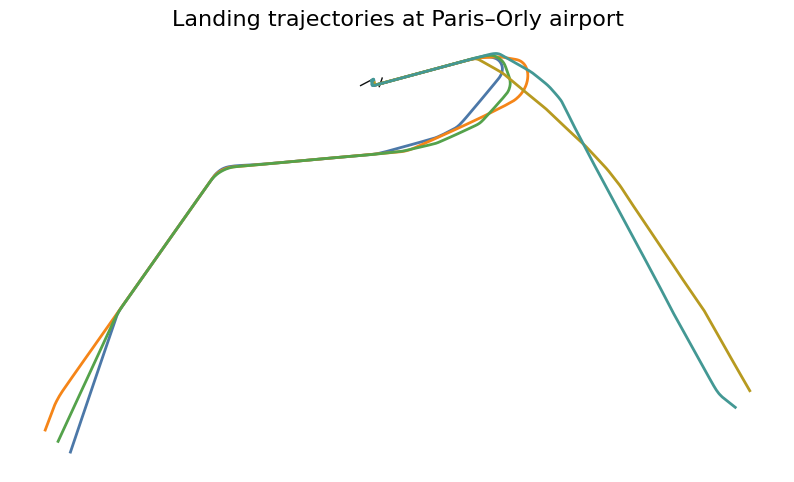

In [26]:
from cartes.crs import Lambert93
from traffic.data import airports

with plt.style.context("traffic"):

    fig, ax = plt.subplots(subplot_kw=dict(projection=Lambert93()))

    airports["LFPO"].plot(ax, footprint=False, runways=dict(linewidth=1))
    for flight in subset:
        flight.plot(ax, linewidth=2)

    ax.set_title("Landing trajectories at Paris–Orly airport")

In [27]:
from traffic.data import airports

chart = (
    alt.layer(
        *(flight.geoencode().encode(alt.Color("callsign:N")) for flight in subset)
    )
    .properties(title="Landing trajectories at Paris–Orly airport")
    .configure_legend(orient="bottom")
    .configure_view(stroke=None)
    .configure_title(anchor="start", font="Lato", fontSize=16)
)
chart

alt.LayerChart(...)

In [28]:
subset.map_leaflet(zoom=8)

Map(center=[48.58543506561279, 2.4247905187211756], controls=(ZoomControl(options=['position', 'zoom_in_text',…

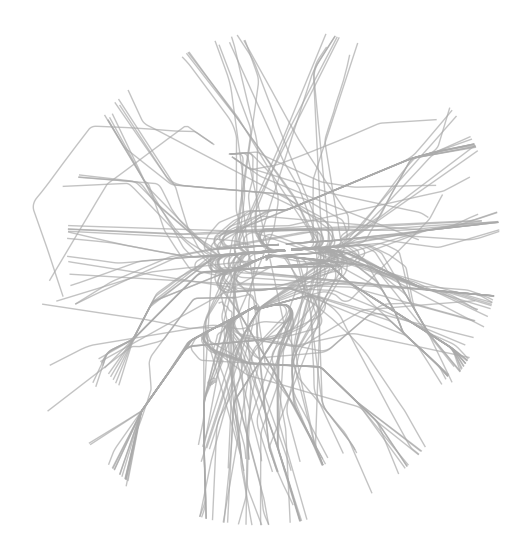

In [29]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=Lambert93()))
    quickstart.plot(ax, alpha=.7)

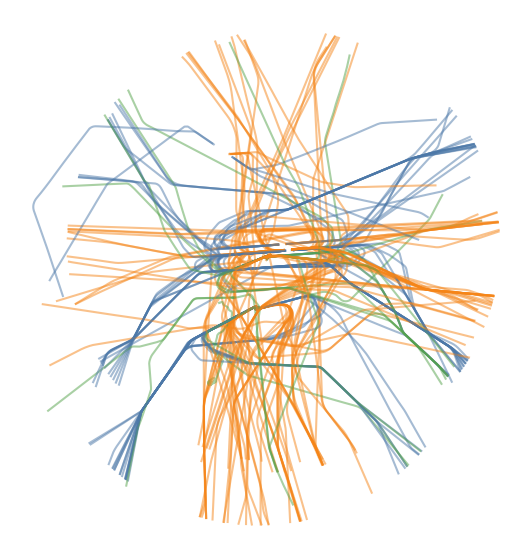

In [30]:
import pandas as pd

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=Lambert93()))

    for flight in quickstart:
        if pd.isna(flight.vertical_rate_mean):
            continue
        if flight.vertical_rate_mean < -500:
            flight.plot(ax, color="#4c78a8", alpha=0.5)  # blue
        elif flight.vertical_rate_mean > 1000:
            flight.plot(ax, color="#f58518", alpha=0.5)  # orange
        else:
            flight.plot(ax, color="#54a24b", alpha=0.5)  # green

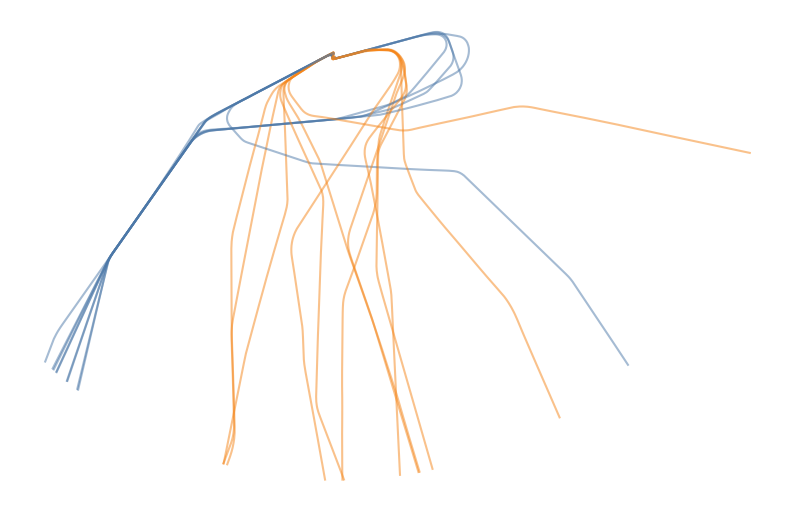

In [31]:
from traffic.data import airports

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=Lambert93()))

    for flight in quickstart:
        if pd.isna(flight.vertical_rate_mean):
            continue
        if flight.vertical_rate_mean < -500:
            if flight.last("5 min").intersects(airports["LFPO"]):
                flight.plot(ax, color="#4c78a8", alpha=0.5)
        elif flight.vertical_rate_mean > 1000:
            if flight.first("5 min").intersects(airports["LFPO"]):
                flight.plot(ax, color="#f58518", alpha=0.5)

In [32]:
import pandas as pd
from tqdm.rich import tqdm

information = list()

for flight in tqdm(quickstart):
    if landing := flight.aligned_on_ils("LFPO").next():
        information.append(
            {
                "callsign": flight.callsign,
                "icao24": flight.icao24,
                "airport": "LFPO",
                "stop": landing.stop,
                "ILS": landing.ILS_max,
            }
        )
    elif landing := flight.aligned_on_ils("LFPG").next():
        information.append(
            {
                "callsign": flight.callsign,
                "icao24": flight.icao24,
                "airport": "LFPG",
                "stop": landing.stop,
                "ILS": landing.ILS_max,
            }
        )
    elif landing := flight.aligned_on_ils("LFPB").next():
        information.append(
            {
                "callsign": flight.callsign,
                "icao24": flight.icao24,
                "airport": "LFPB",
                "stop": landing.stop,
                "ILS": landing.ILS_max,
            }
        )


stats = pd.DataFrame.from_records(information)
stats

Output()

,callsign,icao24,airport,stop,ILS
0,MSR799,0101de,LFPG,2021-10-07 12:34:22+00:00,26L
1,TAR722,02a195,LFPO,2021-10-07 14:25:04+00:00,06
2,QTR9UU,06a2b1,LFPG,2021-10-07 12:42:49+00:00,26L
3,DAH1000,0a0047,LFPG,2021-10-07 12:27:55+00:00,26L
4,AEA1297,344487,LFPO,2021-10-07 14:33:14+00:00,06
...,...,...,...,...,...
86,SVA127,7103d7,LFPG,2021-10-07 14:54:46+00:00,08R
87,JAL45,86e430,LFPG,2021-10-07 14:29:35+00:00,08R
88,FDX5046,a06310,LFPG,2021-10-07 14:59:59+00:00,09R
89,AMX003,a560f3,LFPG,2021-10-07 14:27:00+00:00,08R


In [33]:
chart = (
    alt.Chart(stats)
    .encode(
        alt.X("utcdayhoursminutesseconds(stop)", axis=alt.Axis(format="%H:%M"), title=None),
        alt.Y("ILS", title=None),
        alt.Color("ILS", legend=None),
        alt.Row("airport", title=None),
    )
    .mark_square(size=80)
    .resolve_scale(y="independent")
    .configure_header(
        labelOrient="top",
        labelAnchor="start",
        labelFont="Lato",
        labelFontWeight="bold",
        labelFontSize=16,
    )
    .configure_axis(labelFontSize=13)
    .properties(width=600)
)
chart

alt.Chart(...)

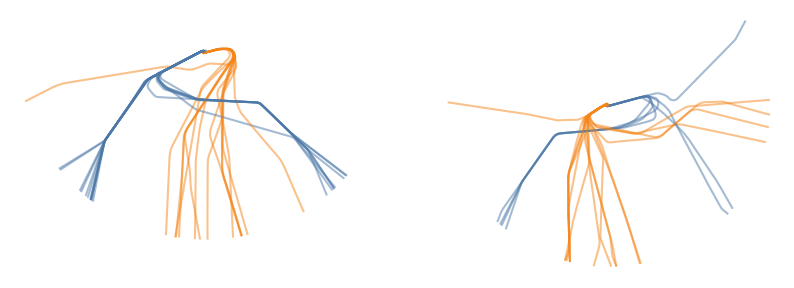

In [34]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(1, 2, subplot_kw=dict(projection=Lambert93()))

    for flight in quickstart:
        if segment := flight.aligned_on_ils("LFPO").next():
            index = int(flight.stop <= pd.Timestamp("2021-10-07 13:30Z"))
            flight.plot(ax[index], color="#4c78a8", alpha=0.5)
        elif segment := flight.takeoff_from_runway("LFPO").next():
            index = int(segment.start <= pd.Timestamp("2021-10-07 13:20Z"))
            flight.plot(ax[index], color="#f58518", alpha=0.5)

/home/runner/work/traffic/traffic/.venv/lib/python3.11/site-packages/pyogrio/raw.py:198: RuntimeWarning: driver TopoJSON does not support open option LAYOUT
  return ogr_read(


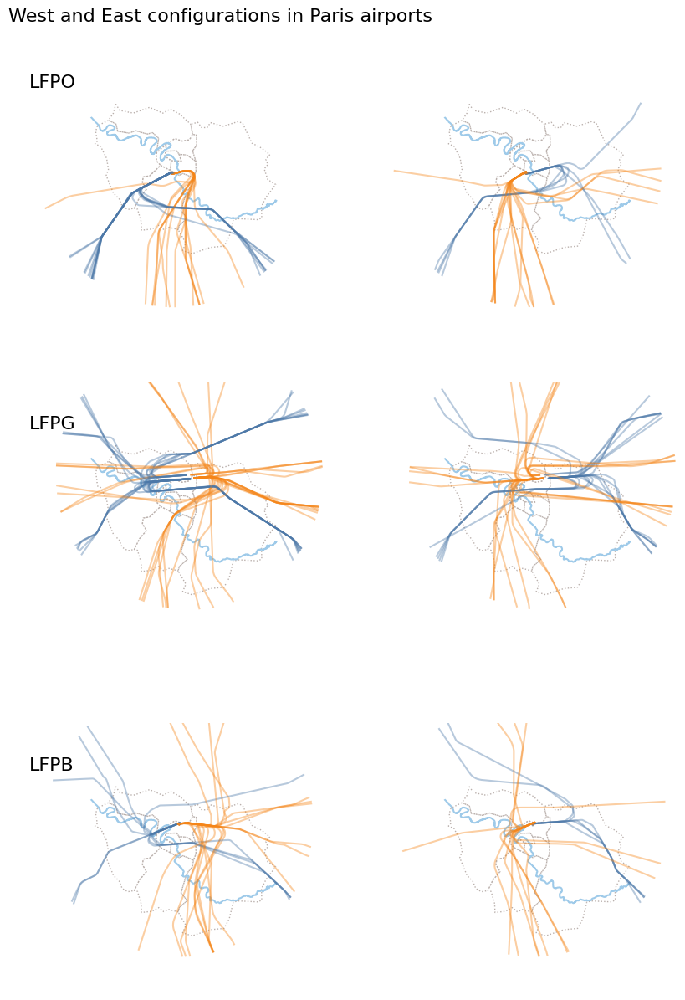

In [35]:
from cartes.atlas import france
from cartes.crs import Lambert93, PlateCarree
from cartes.osm import Nominatim


# background elements
paris_area = france.data.query("ID_1 == 1000")
seine_river = (
    Nominatim.search("Seine river, France")
    .shape.intersection(
        paris_area.union_all().buffer(0.1)
    )
)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(
        3, 2, figsize=(10, 15), subplot_kw=dict(projection=Lambert93())
    )

    airport_codes = ["LFPO", "LFPG", "LFPB"]
    for flight in quickstart:
        phases = flight.phases()

        if phases.query('phase == "DESCENT"'):
            # Determine on which ax to plot based on detected airport
            for airport_index, airport in enumerate(airport_codes):
                if segment := flight.aligned_on_ils(airport).next():
                    # Determine on which column to plot based on time
                    time_index = int(segment.stop <= pd.Timestamp("2021-10-07 13:20Z"))
                    flight.plot(
                        ax[airport_index, time_index], color="#4c78a8", alpha=0.4
                    )
                    break

        elif phases.query('phase == "CLIMB"'):
            # Determine on which ax to plot based on detected airport
            for airport_index, airport in enumerate(airport_codes):
                if segment := flight.takeoff_from_runway(airport).next():
                    # Determine on which column to plot based on time
                    time_index = int(segment.start <= pd.Timestamp("2021-10-07 13:20Z"))
                    flight.plot(
                        ax[airport_index, time_index], color="#f58518", alpha=0.4
                    )
                    break

    # Annotate each map with airport information
    for i, airport in enumerate(airport_codes):
        ax[i, 0].set_title(f"{airport}", loc="left", y=0.8)

    for ax_ in ax.ravel():
        # Background map
        ax_.add_geometries(
            [seine_river], crs=PlateCarree(),
            facecolor="none", edgecolor="#9ecae9", linewidth=1.5,
        )
        paris_area.set_crs(4326).to_crs(2154).plot(
            ax=ax_,
            facecolor="none", edgecolor="#bab0ac", linestyle="dotted",
        )

        ax_.set_extent((0.78, 4.06, 47.7, 49.7))

    fig.suptitle(
        "West and East configurations in Paris airports",
        fontsize=16, x=0.1, y=0.9, ha="left",
    )

In [36]:
from traffic.core import Traffic

def select_landing(airport: "Airport"):
    for flight in quickstart:
        if low_alt := flight.query("altitude < 3000"):         # Flight -> None or Flight
            if not pd.isna(v_mean := low_alt.vertical_rate_mean) and v_mean < -500:  # Flight -> bool
                if low_alt.intersects(airport):                # Flight -> bool
                    if low_alt.aligned_on_ils(airport).has():  # Flight -> bool
                        yield low_alt.last("10 min")           # Flight -> None or Flight

# Traffic.from_flights is more robust than sum() as the function may yield some None values
Traffic.from_flights(select_landing(airports["LFPO"]))

,,count
icao24,callsign,
345359,VLG8030,335
39ceb4,TVF19YP,323
34610f,VLG2848,315
39cea3,TVF54RN,305
3964eb,TVF22LK,297
02a195,TAR722,296
345043,VLG8018,290
346091,VLG76Y,286
44093e,EJU458L,282


In [37]:
(
    quickstart.query("altitude < 3000")      # Traffic -> None | Traffic
    # Lazy iteration is triggered here by the .feature_lt method
    .feature_lt("vertical_rate_mean", -500)  # Flight -> None | Flight
    .intersects(airports["LFPO"])            # Flight -> bool
    .has('aligned_on_ils("LFPO")')           # Flight -> bool
    .last("10 min")                          # Flight -> None | Flight
    # Now evaluation is triggered on 4 cores
    .eval(max_workers=4)  # the desc= argument creates a progress bar
)

,,count
icao24,callsign,
345359,VLG8030,335
39ceb4,TVF19YP,323
34610f,VLG2848,315
39cea3,TVF54RN,305
3964eb,TVF22LK,297
02a195,TAR722,296
345043,VLG8018,290
346091,VLG76Y,286
44093e,EJU458L,282


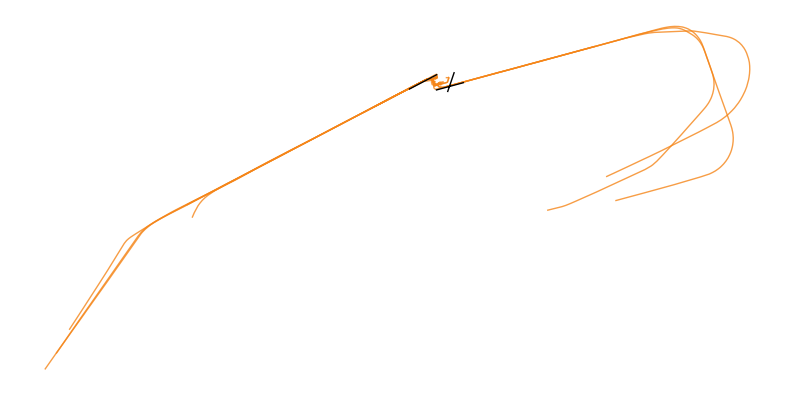

In [38]:
t1 = (
    quickstart
    .has("aligned_on_ils('LFPO')")
    .last('10 min')
    .eval(max_workers=4)
)

with plt.style.context('traffic'):
    fig, ax = plt.subplots(subplot_kw=dict(projection=Lambert93()))
    t1.plot(ax, color="#f58518")
    airports['LFPO'].plot(
        ax, footprint=False,
        runways=dict(linewidth=1, color='black', zorder=3)
    )
    ax.spines['geo'].set_visible(False)

navigationaid=als not in stylesheet, hence ignored


navigationaid=rgl not in stylesheet, hence ignored


navigationaid=sbl not in stylesheet, hence ignored


navigationaid=txc not in stylesheet, hence ignored


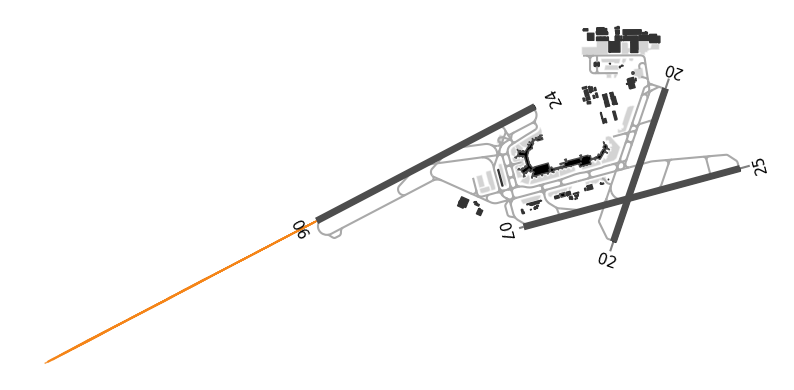

In [39]:
t2 = (
    quickstart
    .next('aligned_on_ils("LFPO")')
    .query("ILS == '06'")
    .last("1 min")
    .eval(max_workers=4)
)

with plt.style.context('traffic'):
    fig, ax = plt.subplots(subplot_kw=dict(projection=Lambert93()))
    t2.plot(ax, color="#f58518")
    airports['LFPO'].plot(ax, labels=dict(fontsize=11))
    ax.spines['geo'].set_visible(False)

navigationaid=als not in stylesheet, hence ignored


navigationaid=rgl not in stylesheet, hence ignored


navigationaid=sbl not in stylesheet, hence ignored


navigationaid=txc not in stylesheet, hence ignored


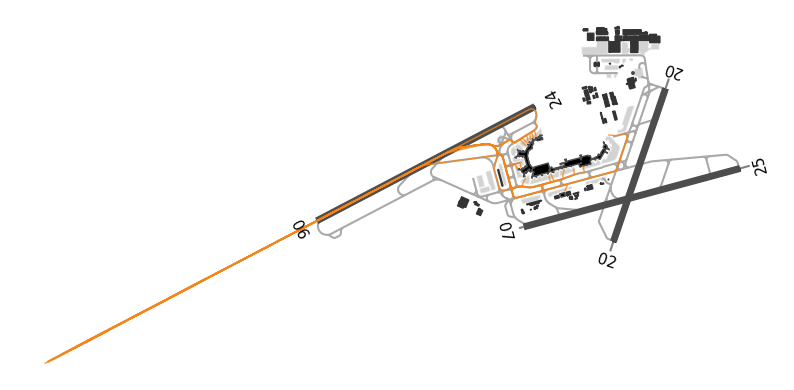

In [40]:
import pandas as pd

def last_minute_with_taxi(flight: "Flight") -> "None | Flight":
    for segment in flight.aligned_on_ils("LFPO"):
        if segment.ILS_max == "06":
            return flight.after(segment.stop - pd.Timedelta("1 min"))

t3 = quickstart.iterate_lazy().pipe(last_minute_with_taxi).eval()

with plt.style.context('traffic'):
    fig, ax = plt.subplots(subplot_kw=dict(projection=Lambert93()))
    t3.plot(ax, color="#f58518", zorder=3)
    airports['LFPO'].plot(ax, labels=dict(fontsize=11))
    ax.spines['geo'].set_visible(False)

In [41]:
def more_than_one_alignment(flight: "Flight") -> "None | Flight":
    segments = flight.aligned_on_ils("LFPG")
    if first := next(segments, None):
        if second := next(segments, None):
            return flight.after(first.start - pd.Timedelta('90s'))

t4 = quickstart.iterate_lazy().pipe(more_than_one_alignment).eval()

flight = t4[0]
segments = flight.aligned_on_ils("LFPG")
first = next(segments)
forward = first.first("70s").forward(minutes=4)

chart = (
    alt.layer(
        airports["LFPG"].geoencode(
            footprint=False,
            runways=dict(strokeWidth=1),
            labels=dict(fontSize=10),
        ),
        flight.geoencode().mark_line(stroke="#bab0ac"),
        forward.geoencode(stroke="#79706e", strokeDash=[7, 3], strokeWidth=0.8),
        first.geoencode().encode(alt.Color("ILS")),
        next(segments).geoencode().encode(alt.Color("ILS")),
    )
    .properties(
        title=f"Runway change at LFPG airport with {flight.callsign}",
        width=600,
    )
    .configure_view(stroke=None)
    .configure_legend(orient="bottom")
    .configure_title(font="Lato", fontSize=16, anchor="start")
)
chart

/home/runner/work/traffic/traffic/src/traffic/core/flight.py:1934: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  last_line.latitude,


alt.LayerChart(...)